# `California Housing Prediction`

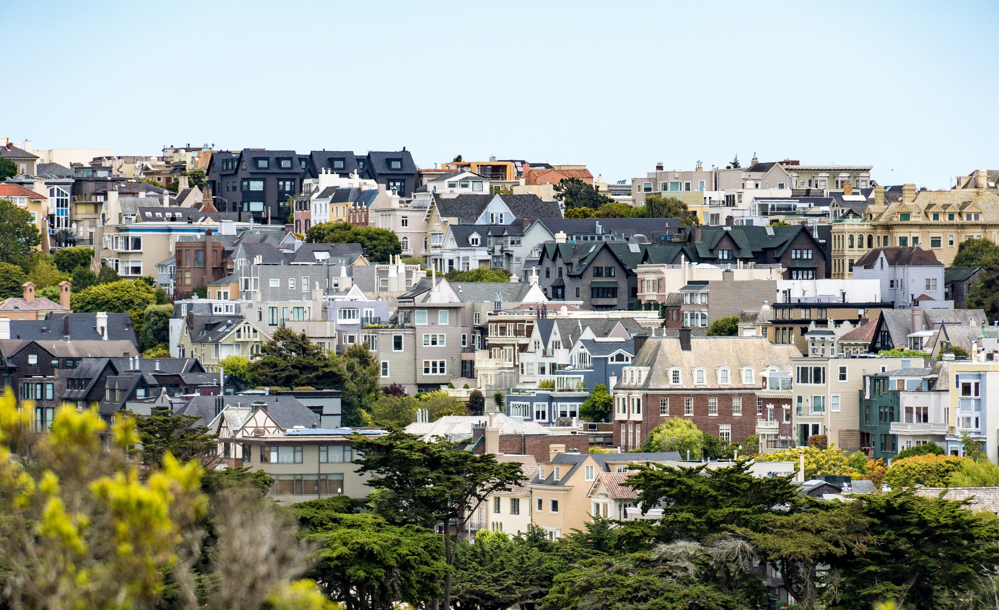

## 1	Business Problem Understanding	
> ###   a.	Context
As a real estate agency, deciding the right property prices can be challenging. On one side, if the price given by the seller is too high, it may resulting in the failure of selling the property. But, on the other side, real estate agents wanted to generate as much profit as possible. It can be very difficult to determine the right price both for the property agents and the potential customer. That is why property agency tends to use valuator to determine the valuation of a property, but it still led to a few problems, such as, the high cost of hiring and operational, the time it takes for the valuation will be days or even weeks, and the valuation result could even be bias or subjective due to the personal opinion or likeness. So machine learning based on real datasets can be proven benificial to lower future cost, valuation result within seconds (lower time taken), and due to its less prone to bias. 



> ###	b.	Problem Statement
Always hiring a valuator for each house can be costly, takes much more time (days or even weeks), and their valuation is also more prone to bias (subjective). It could also lead to inconsistency in the valuation result. Other than that, due to their incapabilities of handling large volumes of request in valuation, limited by human limitations and the man-power, it could slow down the real estate agency business chain. So, only relying on the manual valuator work could be proven harmful both in the short-term, and specifically on the long-term



> ###	c.	Goals
Based on the problems above, **Supervised Reggression** models will be used to make California house prices prediction that minimizes the residual. The goal is to develope a model which can predict house pricing without overfitting or underfitting. Using machine learning could give advantage in the business terms to simplify the work need to be done, and as well as the cost reduction.



> ###	d.	Analytic Approach
Analyzing data to uncover patterns from the dataset features in determining the estimated house value, whether a feature could influence the price tends to be higher or lower. There are geographical features, such as the latitude, longitude, and the ocean proximity. also other demographic feature, such as the population, median income, etc. Analyzing those features could give us insights to understand factors that could influence the house value



> ###	e.	Metric Evaluation
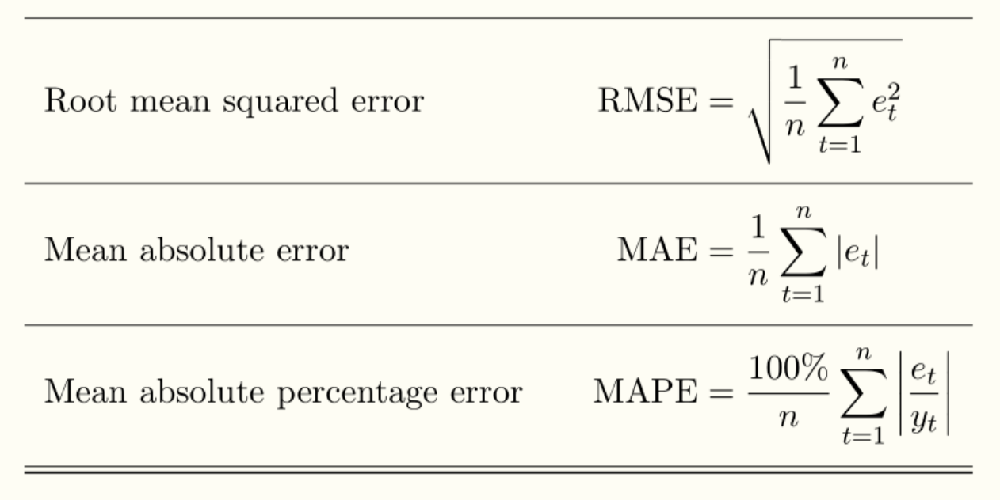

For general model evaluation, i will use RMSE (Root Mean Squared Error), MAE (Mean Absolute Error), and MAPE (Mean Absolute Percentage Error). Below is the explanation of how does each of the evaluation works, and its explanation
1. Root Mean Squared Error (RMSE)

- Calculate the residuals (the difference between y actual and y pred)
- Square each of these residuals to make it in positive value.
- Calculate the average(mean) of these squared differences, which is the MSE (Mean Squared Error)
- Square root the results.

The lower the rmse is the better our model in predicting, since it means that the lower the value is, then the average error is minimal

2. Mean Absolute Error (MAE)

- Calculate the residuals (the difference between y actual and y pred)
- Convert each of the residuals to their absolute values (convert it to positive value)
- Calculate the average(mean) of these absolute residuals

Lower MAE values indicates a better model performance. it's easy to understand and interpret

3. Mean Absolute Percentage Error (MAPE) 

- Calculate the residuals (the difference between y actual and y pred)
- Divide each absolute error by the actual value to get the percentage.
- Calculate the average(mean) of these percentage residuals.

The lower the mape is means the better our model prediction. It is easier to interpret in terms of business, since it is in the form of percentages. 

On this project, the model will be specifically **mainly evaluated based on the Mean Absolute Percentage Error (MAPE)**. MAPE measures the accuracy of a forecasting method by calculating the average absolute percentage errors between the predicted and actual values. It is expressed as a percentage rather than the actual residual value which differentiate it from MSE, the mean of all residuals error and RMSE the root mean of the residuals that gives an actual value.

`MAPE Benefits:`
- Ease of interpretation and practical relevance. 
Since MAPE is the percentage of the mean absolute residual, so it could help us understand the error magnitude relative to actual values. Easier to make business decision because it's ease of understandbility.

- Scale invariance and proportionality. 
In the case of housing prices. the value of a house can vary widely and distributed from low-end to high-end houses. so mape have the upper hand as the evaluation metric, because MAPE measures the relative error, making it scale-invariant. MAPE also gives equal importance to errors in both low and high-priced houses, ensuring the model is not biased towards either end of the price range.

- Less sensitive to Outliers.
Since it uses the absolute errors, MAPE is less sensitive to outliers unlike MSE and RMSE which square the error.


## 2. Data Understanding

In [3]:
# Analysis and Visualizations
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msg
from scipy.stats import shapiro
import warnings
warnings.filterwarnings('ignore')
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import mapclassify as mc

# Data split & CV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# Preprocessing
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline

# Models
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso

# Metrics Evaluation
from sklearn.metrics import mean_squared_error, mean_absolute_error 
from sklearn.metrics import mean_absolute_percentage_error

# Explainable Model
import shap
import lime
from lime import lime_tabular

# Model Saving
import pickle

In [5]:
df = pd.read_csv('data_california_house.csv')
df.sample(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
6617,-118.21,33.89,42.0,1254.0,225.0,929.0,235.0,4.3646,<1H OCEAN,116200.0
1705,-116.99,32.85,32.0,5211.0,949.0,3025.0,948.0,4.0931,<1H OCEAN,134200.0
14054,-121.73,38.13,40.0,1266.0,257.0,547.0,247.0,3.0288,INLAND,164400.0
4959,-118.29,33.74,29.0,1503.0,411.0,1368.0,390.0,2.1473,NEAR OCEAN,195300.0
6716,-118.55,34.21,35.0,2592.0,490.0,1427.0,434.0,5.0623,<1H OCEAN,246400.0
3212,-120.64,37.70,16.0,284.0,51.0,239.0,46.0,1.8958,INLAND,137500.0
12835,-118.31,34.00,47.0,1551.0,362.0,1329.0,322.0,1.9792,<1H OCEAN,116400.0
3274,-117.09,32.69,20.0,1102.0,205.0,852.0,217.0,3.1833,NEAR OCEAN,108300.0
10739,-121.25,36.32,12.0,4776.0,1082.0,4601.0,1066.0,2.9184,<1H OCEAN,100500.0
12488,-122.39,37.60,44.0,2304.0,384.0,986.0,379.0,4.6520,NEAR OCEAN,387100.0


**Column Description.**

| **Column** | **Description** |
| --- | --- |
| longitude | Longitude coordinates of the location. A measure of how far west a house is; a higher value is farther west |
| latitude | Latitude coordinates of the location. A measure of how far north a house is; a higher value is farther north |
| housing_median_age | Median age of a house within a block |
| total_rooms | Total number of rooms within a block |
| total_bedrooms | Total number of bedrooms within a block |
| population | Total number of people residing within a block |
| households | Total number of households, a group of people residing within a home unit, for a block |
| median_income | Median income for households within a block of houses (measured in tens of thousands of US Dollars) |
| ocean_proximity | Housing distance from the sea |
| median_house_value | Median house value for households within a block (measured in US Dollars) |

Based on the column information and this dataset [source](https://www.kaggle.com/datasets/camnugent/california-housing-prices), we know that each row of the dataset does not represents a single house. Instead it represents a block of residence. A block group is the smallest geographical unit for which the U.S. Census Bureau publishes sample data (a block group typically has a population of 600 to 3,000 people). And it also means that the house value in each row is a median from a block residence.

Note : the "median_income" column is measured in tens of thousands of USD, since it can be misleading so i will convert it later to the actual value by multiplying it with 10.000

In [3]:
print(f'Total rows and columns: {df.shape}')
display(df.info(), df.describe(), df.describe(include='object'))

Total rows and columns: (14448, 10)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.1+ MB


None

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


,ocean_proximity
count,14448
unique,5
top,<1H OCEAN
freq,6369


Based on the 2 data information above, We can gain these insights:

- The dataset contains 13 columns (1 categorical column, 2 geospatial columns (lat, long), 10 numerical columns) with 14448 rows
- The dataset has a few missing values on total_bedrooms
- By observing the data describe we can see that a few columns are indicated has outliers on the upper bound, where the difference between the 75% and the max value of the data is big. Such as on the total_rooms, total_bedrooms, population, households, median_income, and also on the median_house_value


## 3. Exploratory Data Analysis

In [4]:
pd.DataFrame({
    'Column': df.columns.values,
    'Data_type': df.dtypes.values,
    'Null': df.isna().mean().values * 100,
    'Negative': [True if df[col].dtype == float and (df[col] < 0).any() else False for col in df.columns],
    'N_unique': df.nunique().values,
    'Unique_sample': [df[col].unique() for col in df.columns]
})

,Column,Data_type,Null,Negative,N_unique,Unique_sample
0,longitude,float64,0.000000,True,806,"[-119.79, -122.21, -118.04, -118.28, -119.81, ..."
1,latitude,float64,0.000000,False,836,"[36.73, 37.77, 33.87, 34.06, 33.8, 33.81, 38.6..."
2,housing_median_age,float64,0.000000,False,52,"[52.0, 43.0, 17.0, 50.0, 11.0, 14.0, 6.0, 10.0..."
3,total_rooms,float64,0.000000,False,5227,"[112.0, 1017.0, 2358.0, 2518.0, 772.0, 10535.0..."
4,total_bedrooms,float64,0.948228,False,1748,"[28.0, 328.0, 396.0, 1196.0, 194.0, 1620.0, 14..."
5,population,float64,0.000000,False,3498,"[193.0, 836.0, 1387.0, 3051.0, 606.0, 4409.0, ..."
6,households,float64,0.000000,False,1649,"[40.0, 277.0, 364.0, 1000.0, 167.0, 1622.0, 14..."
7,median_income,float64,0.000000,False,9797,"[1.975, 2.2604, 6.299, 1.7199, 2.2206, 6.67, 8..."
8,ocean_proximity,object,0.000000,False,5,"[INLAND, NEAR BAY, <1H OCEAN, NEAR OCEAN, ISLAND]"
9,median_house_value,float64,0.000000,False,3548,"[47500.0, 100000.0, 285800.0, 175000.0, 59200...."


There are no negative values on the dataset, except on the longitude which is not a concern since the value indeed can be negatives. There are no known anomalies based on the information above. The most number of unique values is on the median_income which has 9726. And the lowest is on the ocean_proximity which only consist 5 unique values. There is 1 column in which still contains missing values, that is 'total_bedrooms'. But the missing value is rather very few (only 0.9% of total rows). This will be handled later on.

> ### Numerical Variables

#### Outliers Checking

In [5]:
numerical_col = [var for var in df.columns if (df[var].dtypes != 'object')]

In [6]:
def calculate_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

outlier_df = []

for column in numerical_col:
    outlier_result, lower_bound, upper_bound = calculate_outliers(df, column)
    total_outlier = len(outlier_result)
    outlier_percentage = round(total_outlier / len(df[column]) * 100, 2)
    outlier_df.append([column, total_outlier, outlier_percentage, lower_bound, upper_bound])

outlier_df = pd.DataFrame(outlier_df, columns=["Column", "Total Outliers", "Percentage (%)", "Lower Bound", "Upper Bound"])
outlier_df

,Column,Total Outliers,Percentage (%),Lower Bound,Upper Bound
0,longitude,0,0.00,-127.50000,-112.30000
1,latitude,0,0.00,28.26000,43.38000
2,housing_median_age,0,0.00,-10.50000,65.50000
3,total_rooms,900,6.23,-1094.50000,5693.50000
4,total_bedrooms,879,6.08,-233.00000,1175.00000
5,population,827,5.72,-626.00000,3134.00000
6,households,842,5.83,-208.50000,1091.50000
7,median_income,482,3.34,-0.67765,7.98435
8,median_house_value,757,5.24,-96850.00000,480350.00000


There are 6 columns which consist outliers, although the percentage of outliers in each columns is low (< 10%), with total_rooms has the most outliers (6.23%). All of the outliers are from the upper bound as we already knew that there are no negative values in the columns. So the data will most likely be right-skewed

#### Data Distribution

In [7]:
# Stats numerical data distribution

dist = []

for i in range(len(numerical_col)):
    feature_name = numerical_col[i]
    stat, p_value = shapiro(df[feature_name].dropna())
    
    if p_value > 0.05:
        distribution = "Normally Distributed"
    else:
        distribution = "Not Normally Distributed"
    
    dist.append([feature_name, stat, p_value, distribution])

dist_df = pd.DataFrame(dist, columns=['Feature', "Shapiro", 'P-value', 'Data Distribution'])
dist_df

,Feature,Shapiro,P-value,Data Distribution
0,longitude,0.896553,0.000000e+00,Not Normally Distributed
1,latitude,0.877645,0.000000e+00,Not Normally Distributed
2,housing_median_age,0.978259,6.905599e-42,Not Normally Distributed
3,total_rooms,0.696849,0.000000e+00,Not Normally Distributed
4,total_bedrooms,0.735305,0.000000e+00,Not Normally Distributed
5,population,0.699650,0.000000e+00,Not Normally Distributed
6,households,0.746094,0.000000e+00,Not Normally Distributed
7,median_income,0.895092,0.000000e+00,Not Normally Distributed
8,median_house_value,0.911827,0.000000e+00,Not Normally Distributed


Based on the statistical Shapiro test, it is concluded that all of the numerical columns in the dataset is not normally distributed with the assumption it will most-likely be right-skewed since we know that the outliers are mostly from the upper bound. This insight will be valuable in processing this dataset later on. For instance, we know that using the median is the right thing to do instead of the mean value, etc. Now, let's see the data distribution through visualizations.

#### Data Distribution Visualizations

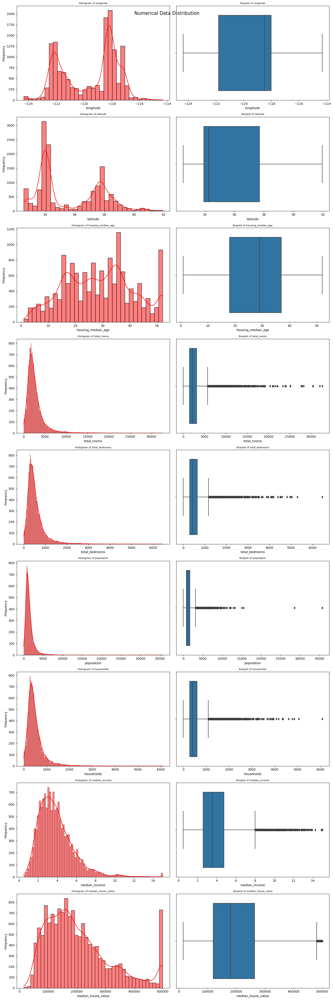

In [8]:
plt.figure(figsize=(15, 45))

for index, col in enumerate(numerical_col):
    
    # Histogram
    plt.subplot(len(numerical_col), 2, index * 2 + 1)
    sns.histplot(df[col], kde=True, color='red')
    plt.title(f'Histogram of {col}', size=8)
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Boxplot
    plt.subplot(len(numerical_col), 2, index * 2 + 2)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}', size=8)
    plt.xlabel(col)

plt.suptitle('Numerical Data Distribution', size=15)
plt.tight_layout()
plt.show()

Rightly as assumed, most of the data distributions in each columns are right-skewed which means most of the outliers are originated from the upper bound of the data. With 'population' has the worst outliers.

> ### Categorical Features

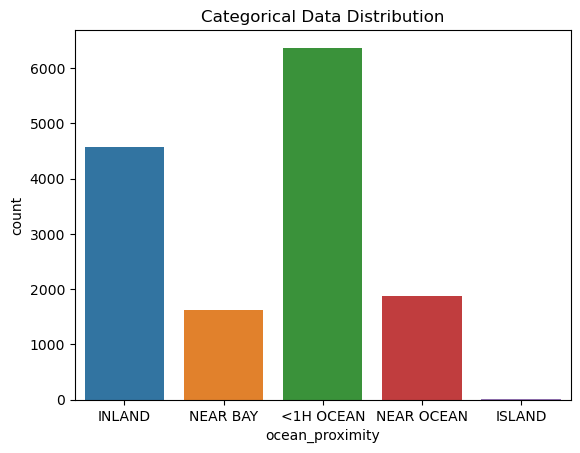

In [9]:
sns.countplot(data=df, x='ocean_proximity')
plt.title('Categorical Data Distribution')
plt.show()

The distribution on the ocean_proximity is also not normally distributed based on the graph above, which shows that most of the house in the dataset are located '<1H Ocean, followed by 'Inland'. But my attention is caught by the 'Island' values which is not showed properly in the barplot this could indicates rare values, below all the others category. Let's analyze it further more.

In [10]:
df[df['ocean_proximity']=='ISLAND']

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
8303,-118.33,33.34,52.0,2359.0,591.0,1100.0,431.0,2.8333,ISLAND,414700.0
12680,-118.48,33.43,29.0,716.0,214.0,422.0,173.0,2.6042,ISLAND,287500.0


Rightfully assumed, the 'Island' houses only has 2 rows. this is very little compared to the almost 15.000 rows in the dataset, and could be interpreted as a very rare values. this could resulting in bad modeling. So, in the next section we should handle this.

## 4. Data Cleaning & Feature Engineering	

> #### Missing Value

Checking if there are any missing values on the dataset.

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        137
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

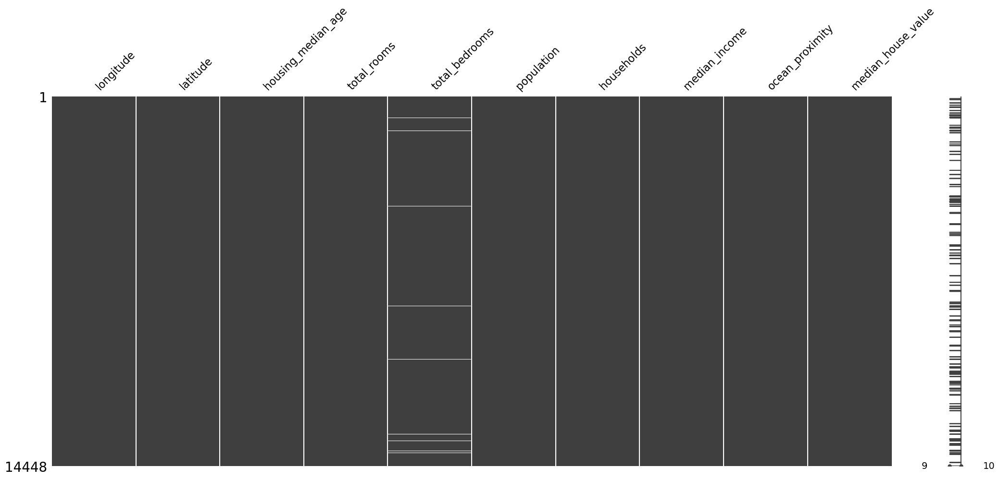

In [11]:
msg.matrix(df=df)
display(df.isna().sum())

plt.show()

The graphic above shows that there are missing values on the total_bedrooms column. Indicated by the bar that not full, differentiating it from the other column's bar. There are specifically 137 total outliers in the total_bedrooms column

> #### Data Duplicates

Checking if there are duplicates in the dataset.

In [12]:
df.duplicated().sum()

0

The dataset has no duplicate.

> #### Replace Value

Since the value of 'median_income' is actually in thousands of USD, so i will convert this column value by multiplying it with 10.000


In [13]:
df['median_income'] = df['median_income'] * 10000
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
3853,-119.01,35.36,36.0,2658.0,626.0,1490.0,529.0,12157.0,INLAND,57000.0
3457,-119.05,35.32,11.0,7035.0,1455.0,3525.0,1387.0,34827.0,INLAND,93600.0
7870,-117.14,32.71,52.0,979.0,314.0,975.0,297.0,12375.0,NEAR OCEAN,100000.0
464,-118.30,34.05,44.0,1612.0,650.0,2028.0,593.0,19152.0,<1H OCEAN,115600.0
2594,-121.37,38.61,42.0,945.0,193.0,460.0,193.0,37569.0,INLAND,127100.0


> #### Remove Rare Values

From the EDA that already we already conducted we can see that there are only 2 values of 'island' in the 'ocean_proximity' column which is a rare values and will be irrelevant for our modeling so i decided to drop these 2 rows. Although in the cost of further model limitation, that our model can't make predictions if the house is in the island.

In [14]:
df['ocean_proximity'].value_counts()

df.drop(index=df[df['ocean_proximity']=='ISLAND'].index, inplace=True)

> #### Generates New Features

Total rooms can influence house prices. From data understanding, we know that each rows represents a block of residence, not a single house. But, we can estimates each house total rooms in that specific block by dividing total rooms (in that block) with total household (the logic is each household would live in a single house)

In [15]:
df['total_rooms/households'] = round(df['total_rooms']/df['households'])

As we generated a new feature for modeling purposes, so when we want to predict a new dataset, we have to make sure that we also generate this feature on that dataset by simply subtract the total rooms by the household before implementing it to the model

## 5. Data Analysis

> #### Features VS Target

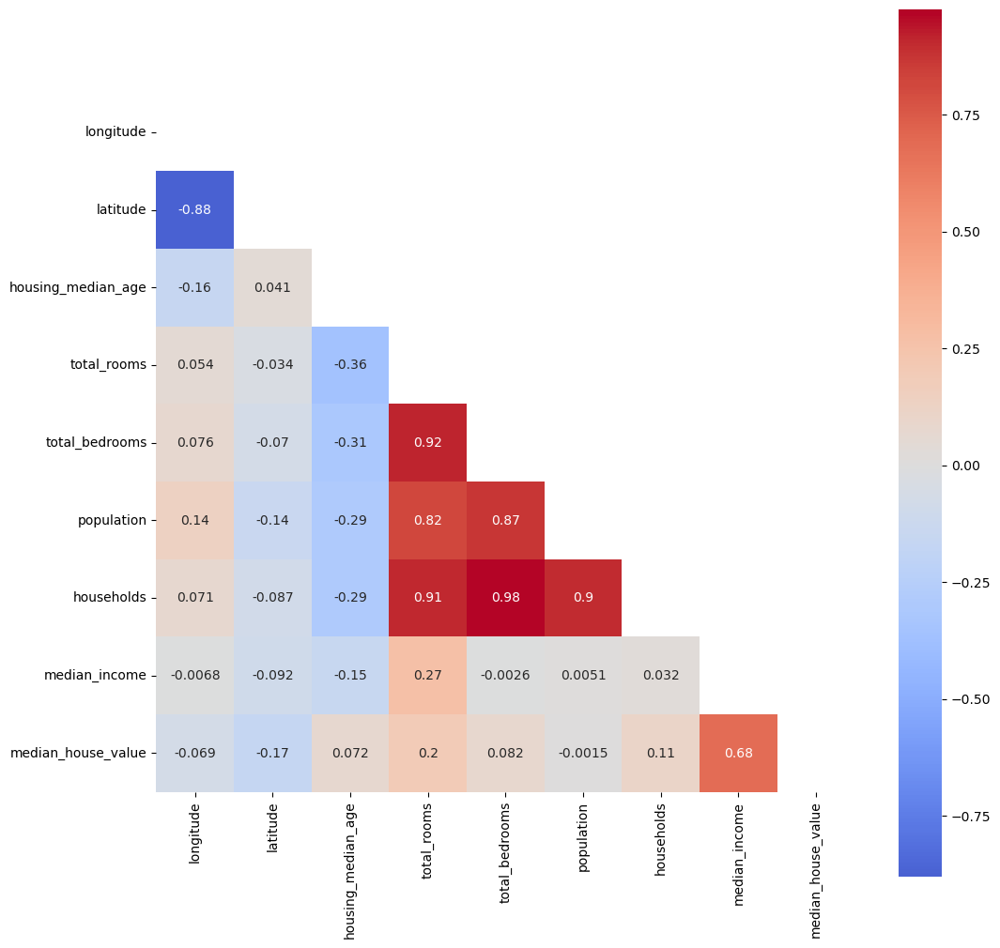

In [16]:
plt.figure(figsize=(12, 12))

matrix = np.triu(df[numerical_col].corr(method='spearman'))

sns.heatmap(data=df[numerical_col].corr(method='spearman'), annot=True, cmap='coolwarm', center=0, mask = matrix, square='True')
plt.show()

`Insight`

The correlation heatmap above shows that the target (median house value) has the most correlation with median income. and it also a positive correlation, which means the higher the median income is in a block, the median house value in a block will also tends to be higher. This is not surprising, since the more expensive houses tends to be grouped in the same neighbourhood, rather than merge with the 'normal' house in terms of buildings and value.

We could also learn that households, population, and total_bedrooms are positively correlated, and the correlation is very high.

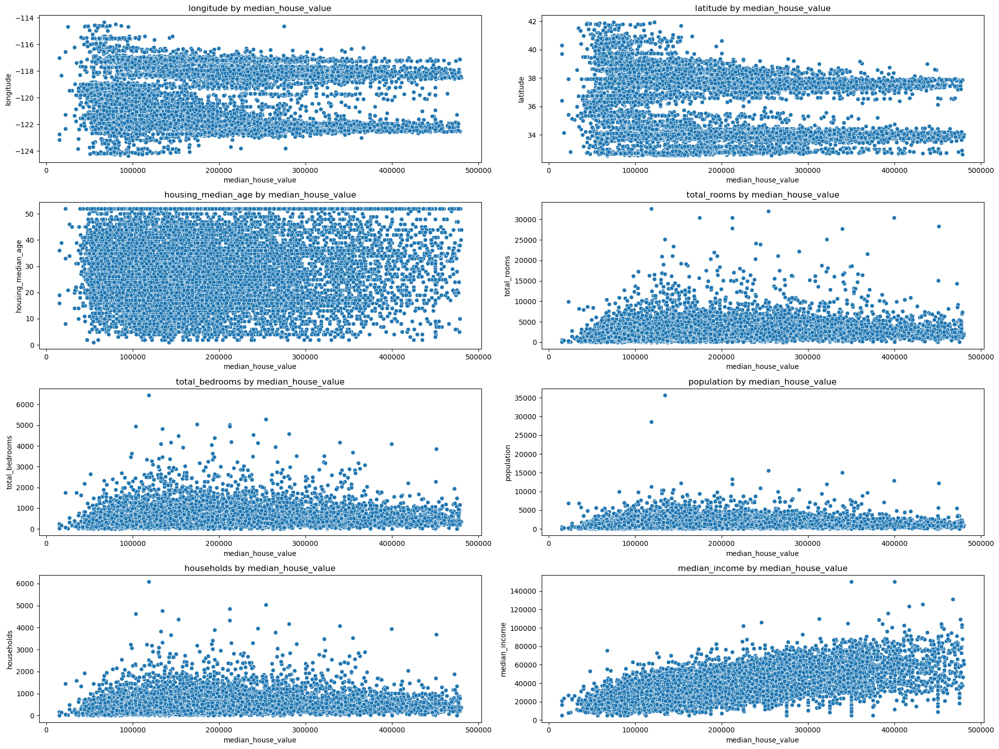

In [86]:
fig, axes = plt.subplots(4, 2, figsize=(20, 15))

for col, x in zip(numerical_col, axes.flatten()):
    ax = sns.scatterplot(data=df, y= col, x='median_house_value', ax= x)
    ax.set_title(f'{col} by median_house_value') 

plt.tight_layout()
plt.show()

`Insight`

- **Geographical Features (lat, long)**

We can see that the the the most western (highest longitude point) and the most northen (highest latitude point), meaning that the norht-west location of california has a lower price. only ranging from an estimated of 0 - 150.000 USD (with only 1 house near the 300.000 USD marks). But when we analyze the price at the longitude of -120 to -116 and the latitude of 33 to 35, these are the 'prime location' in which prices are the highest when the houses are located in this districts. This could indicates that there are 'exclusive' block location that the prices tends to be higher. But we will look at this with more detail later on.

- **House Facilities (Age, Rooms, Bedrooms)**

**Age** : There is non visible clear pattern when we compare the house value to its age, although by logic we can assume that the older the house age is, the lower the price will be. But, based on the data, it does not seem to be the case as the plot shows. We can assume that the older age house is some kind of mansion type house which resulting the price is not too affected by its age.

**Rooms**: Weak positive correlation based on the visualizations and the correlation test. which can be justified because bigger number of rooms usually also means that the houses will be bigger, so resulting in the higher house value.

**Bedrooms**: Not very clear correlation can be seen from the plot. although we can make assumpstions that logically the higher number of bedrooms is, will also make the houses size to be bigger, hence making the price to be higher also.

- **People Demographics (Population, Household, Income)**

**Population**: Weak negative correlation occurs. where the lower the number of population, resulting in a higher house value. This make sense since the higher the house value usually making the house to be bigger than the regular house, meaning that in a block there will be fewer houses, hence lower population in the 'exclusive location'.

**Household**: Weak negative correlation. the lower it is, the higher the house value. Basically the same explanation as the population column. In a lower population block, the household will also be lower, hence lower household in the exclusive location that are more expensive

**Income**: The scatter plot shows a strong positive correlation between income and house value, as the graph shows that the higher the income is, the higher the house value in a block too. Which totally makes sense as people with higher income would most likely to build a more 'mansion-like' houses in the same 'exclusive' block hence making the prices to be higher.


> #### Geographical Location Analysis

In [6]:
''' Plot Two Geopandas Plots Side by Side '''
# defining a simple plot function, input list containing features of names found in dataframe
def Geoplot(df, features):
    
    # load california from module, common for all plots
    cali = gpd.read_file(gplt.datasets.get_path('california_congressional_districts'))
    cali = cali.assign(area=cali.geometry.area)
    
    # Create a geopandas geometry feature; input dataframe should contain .longtitude, .latitude
    gdf = gpd.GeoDataFrame(df,geometry=gpd.points_from_xy(df.longitude,df.latitude))
    project=gcrs.AlbersEqualArea(central_latitude=37.16611, central_longitude=-119.44944) # related to view

    ii=-1
    fig,ax = plt.subplots(1,2,figsize=(20,7),subplot_kw={'projection': project})
    for i in features:

        ii+=1
        tgdf = gdf.sort_values(by=i,ascending=True) 
        gplt.polyplot(cali,projection=project,ax=ax[ii]) # the module already has california 
        gplt.pointplot(tgdf,ax=ax[ii],hue=i,cmap='viridis',legend=True,alpha=1.0,s=3) # 
        ax[ii].set_title(i)

    plt.tight_layout()
    plt.subplots_adjust(wspace=-0.3)

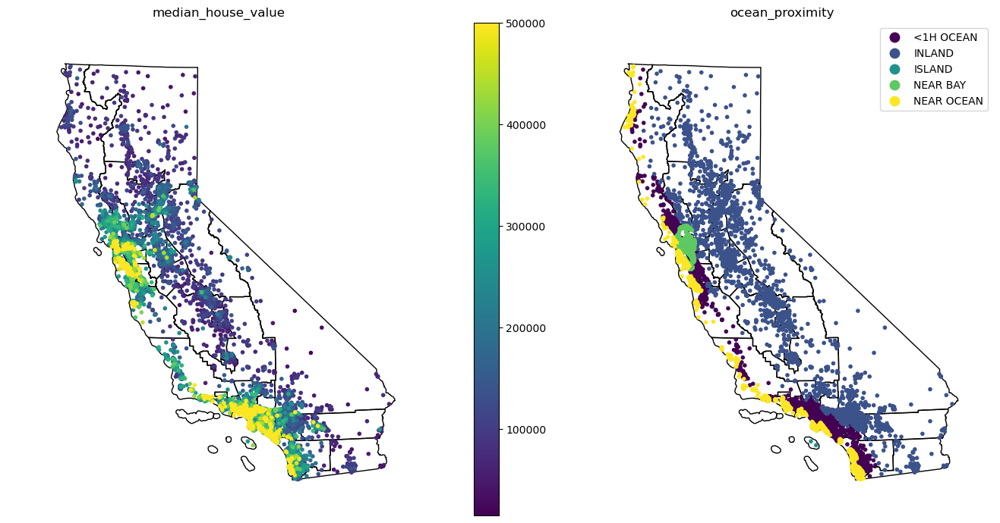

In [7]:
Geoplot(df, ['median_house_value','ocean_proximity'])

`Insight`

1. *Geographical Distribution of Median House Values*:
   - Higher house values (shown in yellow) are predominantly concentrated along the coastal areas, especially near major cities like Los Angeles and San Francisco, which means that location is a significant factor influencing house prices. Proximity to the ocean and urban areas substantially drives up property values.
   - Inland areas generally have lower house values (shown in darker colors).

2. *Proximity to Ocean and House Values*:
   - Areas categorized as NEAR OCEAN (in yellow) and NEAR BAY (in green) tend to have higher house values. Coastal regions, particularly those near major urban centers like San Francisco Bay and Los Angeles, show significantly higher median house values.
   - Inland areas (in blue) generally have lower house values, indicating a strong correlation between proximity to the ocean and higher property values.
   - This trend reflects the premium associated with living near the ocean and in major metropolitan areas. The closer it is to the ocean the higher the prices are, except on the most northen-western part of california, where the prices are lower. Indicates that the 'exclusive' neighborhood are distributed along the west coast, including the famous San-Francisco as the denser city.



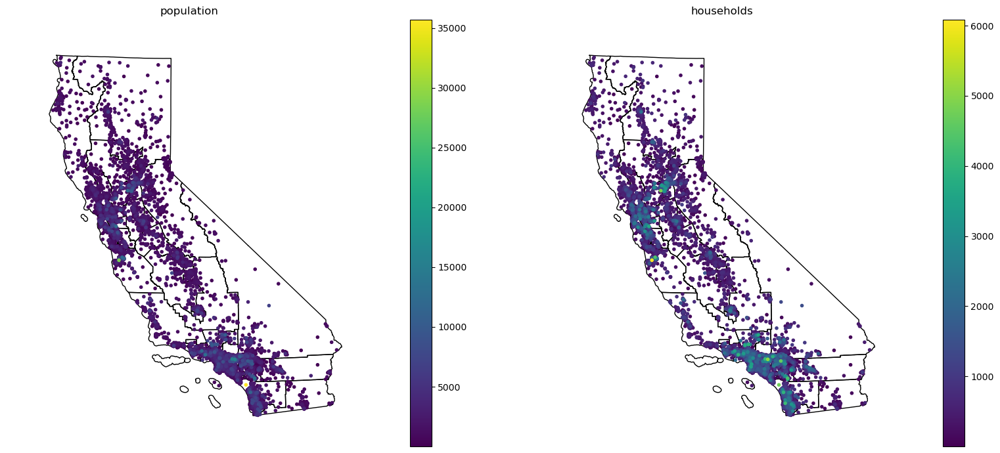

In [8]:
Geoplot(df, ['population','households'])

`Insight`

1. *Population Distribution*:
   - San Francisco population are mostly on the 5.000 - 10.000, indicated by the darker color are scattered more all around the map (not many different colors are showed in the map).
   - High population densities (indicated by yellow and green) are concentrated in urban and coastal areas, particularly in Los Angeles, San Francisco Bay Area, and San Diego. The population are denser in the near ocean and near bay location. which means that those locations are the preferred housing block of most people.
   - Inland areas generally have lower population densities (indicated by darker colors).

2. *Household Distribution*:
   - Similar to the population distribution, areas with a higher number of households are concentrated in urban and coastal regions.
   - There is a noticeable correlation between high population density and high household counts. The higher the total population in the block, means also the higher the households count is, as households is the subset of the population.

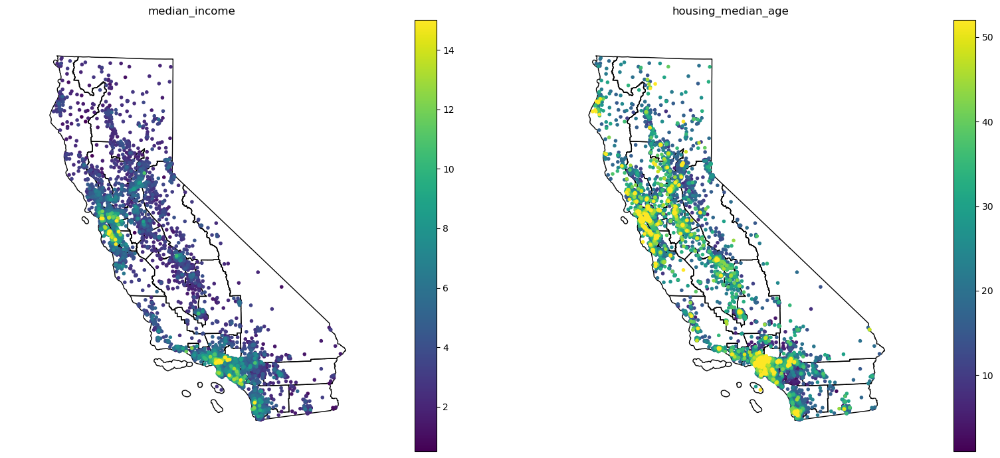

In [9]:
Geoplot(df, ['median_income','housing_median_age'])

`Insight`
1. *Median Income Distribution*:
   - Higher median incomes (indicated by yellow and green) are predominantly found in coastal areas and major urban centers like the San Francisco Bay Area, Los Angeles, and San Diego. The closer the house to the ocean the median income is also higher, which if we connect it to the analysis before, it's because the 'prime location' of exclusive houses are on the near ocean marks. Central and northern inland regions generally have lower median incomes.

2. *Housing Median Age Distribution*:
   - Areas with newer housing stock (younger median age, indicated by darker colors) are primarily in regions experiencing recent development or expansion, such as parts of Southern California and certain inland areas.
   - Interestingly the median housing age on the 'prime location' near the ocean where the population tends to be richer with higher median income are also tends to be older.


> #### House Prices by Ocean Proximity

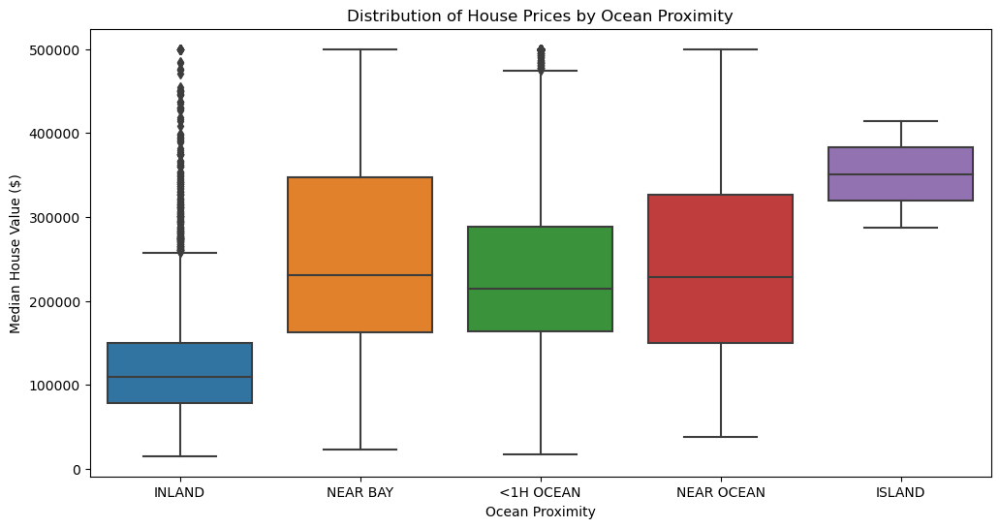

In [10]:
# Box plot
plt.figure(figsize=(12, 6))
sns.boxplot( data=df, x='ocean_proximity', y='median_house_value')
plt.title('Distribution of House Prices by Ocean Proximity')
plt.xlabel('Ocean Proximity')
plt.ylabel('Median House Value ($)')
plt.show()

`Insight`
- Location Significantly Affects House Prices:

Proximity to the ocean, either near the bay or directly near the ocean, is associated with significantly higher house prices.
Inland properties are generally more affordable, making them suitable for buyers with lower budgets. 
Given the lower median prices inland, Marketing efforts can target buyers looking for cost-effective options in the inland area.

- High Variability in Coastal Areas:

There is considerable variability in house prices near the ocean and bay, suggesting that these areas have a diverse range of property types and values.

- Potential for High-Value Sales:

Properties near the ocean or bay have the potential for higher sales values, making them attractive for real estate investments.



## 6.	Modelling	

>###   a.	Data Preparation

Since the missing value of this dataset is only on 1 column (total_rooms), and is very low (0.9% of the dataset), so for this modeling, it is decided that we will handle it by simply just dropping it. Although, later on we will handle the missing value with imputer in the pipeline for our model to be able to predict new datasets incase it still contains missing value.

In [23]:
# Dropping missing value
df.dropna(inplace=True)

df.isna().sum()

longitude                 0
latitude                  0
housing_median_age        0
total_rooms               0
total_bedrooms            0
population                0
households                0
median_income             0
ocean_proximity           0
median_house_value        0
total_rooms/households    0
dtype: int64

The outliers in this dataset is proven to be not very extreme, since all of it is only ranging from 1% - 6% from the total data. So i decided to keep it still in the data for model training. But, i decided to only drop the outliers in our target which is the median house value. The thoughts behind this is to improving model accuracy and stability for predicting the target since the value of the target column is pretty high than the rest of the data.

In [24]:
# Defining the first and the third quartile
Q1 = df['median_house_value'].quantile(0.25)
Q3 = df['median_house_value'].quantile(0.75)
IQR = Q3 - Q1

# Lower Bound & Upper Bound
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtering outlier on the target
df = df[(df['median_house_value'] >= lower_bound) & (df['median_house_value'] <= upper_bound)]

In [25]:
def calculate_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

outlier_df = []

for column in numerical_col:
    outlier_result, lower_bound, upper_bound = calculate_outliers(df, column)
    total_outlier = len(outlier_result)
    outlier_percentage = round(total_outlier / len(df[column]) * 100, 2)
    outlier_df.append([column, total_outlier, outlier_percentage, lower_bound, upper_bound])

outlier_df = pd.DataFrame(outlier_df, columns=["Column", "Total Outliers", "Percentage (%)", "Lower Bound", "Upper Bound"])
outlier_df

,Column,Total Outliers,Percentage (%),Lower Bound,Upper Bound
0,longitude,0,0.00,-127.40875,-112.33875
1,latitude,0,0.00,28.23000,43.43000
2,housing_median_age,0,0.00,-10.50000,65.50000
3,total_rooms,862,6.36,-1076.50000,5637.50000
4,total_bedrooms,833,6.14,-233.50000,1178.50000
5,population,775,5.72,-629.12500,3165.87500
6,households,786,5.80,-206.50000,1093.50000
7,median_income,232,1.71,-5338.75000,76199.25000
8,median_house_value,196,1.45,-78462.50000,440637.50000


>###	b.	Define Features and Target

In [26]:
# X = Features
# y = Label

X = df.drop(['median_house_value'], axis=1)
y = df['median_house_value']

>###	c.	Data Splitting


In [27]:
# Data splitting with the test size of 20% from the whole dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

print(f'Training datasets: {X_train.shape}')
print(f'Testing datasets: {X_test.shape}')

Training datasets: (10846, 10)
Testing datasets: (2712, 10)


>###	d.	Model Benchmarking

In [67]:
# Define Models for looping

models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(),
    'KNN': KNeighborsRegressor(),
    'Random Forest': RandomForestRegressor(),
    'XG Boost': XGBRegressor(),
    'Adaboost': AdaBoostRegressor(),
    'Gradient Boost': GradientBoostingRegressor(),
    'Ridge':Ridge(alpha=1),
    'Lasso':Lasso(alpha=0.1) 
}

score_mape = []
mean_mape = []
std_mape = []

score_rmse = []
mean_rmse = []
std_rmse = []

score_mae = []
mean_mae = []
std_mae = []

numeric_features = X.select_dtypes(include=[np.number]).columns.tolist()

numeric_transformer = Pipeline([
    ('imputer', IterativeImputer(initial_strategy='median'))
])

categorical_transformer = Pipeline([
    ('encoding', OneHotEncoder(drop='first'))
])

preprocess = ColumnTransformer([
    ('numerical', numeric_transformer, numeric_features),
    ('categorical', categorical_transformer, ['ocean_proximity'])
], remainder='passthrough')

crossval = KFold(n_splits=5, shuffle=True, random_state=7)

for name, model in models.items():

    estimator = Pipeline([
        ('preprocessing', preprocess),
        ('model', model)
    ])

    # RMSE
    model_cv_rmse = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_root_mean_squared_error', 
        error_score='raise',
        n_jobs=-1
        )

    # print(model_cv_rmse, i)

    score_rmse.append(model_cv_rmse)
    mean_rmse.append(model_cv_rmse.mean())
    std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_error', 
        error_score='raise',
        n_jobs=-1
        )

    # print(model_cv_mae, i)

    score_mae.append(model_cv_mae)
    mean_mae.append(model_cv_mae.mean())
    std_mae.append(model_cv_mae.std())

    model_cv_mape = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_percentage_error', 
        error_score='raise',
        n_jobs=-1
        )

    # print(model_cv_mape, i)

    score_mape.append(model_cv_mape)
    mean_mape.append(model_cv_mape.mean())
    std_mape.append(model_cv_mape.std())

estimator    

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical',
                                                  Pipeline(steps=[('imputer',
                                                                   IterativeImputer(initial_strategy='median'))]),
                                                  ['longitude', 'latitude',
                                                   'housing_median_age',
                                                   'total_rooms',
                                                   'total_bedrooms',
                                                   'population', 'households',
                                                   'median_income',
                                                   'total_rooms/households']),
                                                 ('categorical',
                                                  Pipeline(steps=[('encoding',
                                                                   OneHotEncoder(drop='first'))]),
                                                  ['ocean_proximity'])])),
                ('model', Lasso(alpha=0.1))])

`Pipeline Explanation`

Overall the pipeline is pretty simple with only 2 steps. The first step is the data preprocessing which divided for the numerical features and categorical feature, and then the second step is the modeling itself which will be looped through all the models that we determined to test. The details will be explained below:

1. Preprocessing:
    - Numerical Features

    The preprocessing step for the numerical features is to handle the missing value first using the iteratvie imputer, which is a multivariate imputer by modeling each feature with missing values as a function of other features. Handling missing value is vital because some of the models won't work if there are still missing values in the data. So, although we have already dropped the missing value before because the percentage is very small, but we will still use the imputer for the pipeline for future use, incase there are missing values in the new data that we want to predict. 
    

    - Categorical Feature
    
    Since the categorical feature of this dataset is only ocean_proximity that have low cardinality (4 values), so the only preprocessing needed is to encode the data using onehot encoder which will make 3 new columns as the original column value is 4, but we drop the first value.

2. Modeling

    - The model algorithm will be given the data that already completed the preprocessing step, then fit into the data train.


In [73]:
pd.DataFrame({
    'Model': models.items(),
    'Score RMSE': score_rmse,
    'Mean RMSE': mean_rmse,
    'Std RMSE': std_rmse,
    'Score MAE': score_mae,
    'Mean MAE': mean_mae,
    'Std MAE': std_mae,
    'Mean MAPE': mean_mape,
    'Std MAPE': std_mape,
    'Score MAPE': score_mape
}).sort_values('Mean MAPE', ascending=False)

,Model,Score RMSE,Mean RMSE,Std RMSE,Score MAE,Mean MAE,Std MAE,Mean MAPE,Std MAPE,Score MAPE
4,"(XG Boost, XGBRegressor(base_score=None, boost...","[-43544.75168551195, -42583.16055292664, -4309...",-44176.722882,1388.277603,"[-29976.692414314515, -29021.492917783253, -29...",-30075.885677,664.020764,-0.180547,0.005467,"[-0.18239839076950784, -0.17216868097511512, -..."
3,"(Random Forest, RandomForestRegressor())","[-46370.626131359124, -43497.55472514126, -444...",-46075.240819,1953.849473,"[-31462.327649769584, -29869.44846011987, -311...",-31415.304498,1024.721049,-0.188477,0.008274,"[-0.19392102536721512, -0.17791492418437094, -..."
6,"(Gradient Boost, GradientBoostingRegressor())","[-50007.170016303186, -48524.60047744163, -488...",-49844.491410,1142.979799,"[-35839.4504865342, -35157.58328889927, -35276...",-35629.835328,610.393161,-0.214312,0.007505,"[-0.21873798076133932, -0.2099429521576878, -0..."
1,"(Decision Tree, DecisionTreeRegressor())","[-63366.91901852259, -61272.41359965625, -6615...",-64591.558927,1986.770311,"[-43044.01059907834, -40962.97925311203, -4503...",-43620.641954,1553.347747,-0.252497,0.008777,"[-0.2555958654222632, -0.2363767210914304, -0...."
8,"(Lasso, Lasso(alpha=0.1))","[-60807.28256242217, -57906.20054483181, -5782...",-59830.179429,1685.533929,"[-45024.0644170134, -43077.10696646284, -43716...",-44189.818036,723.146893,-0.273557,0.007035,"[-0.27939287451852113, -0.2643571743601559, -0..."
0,"(Linear Regression, LinearRegression())","[-60807.27994996377, -57906.18080929312, -5782...",-59830.180713,1685.533501,"[-45024.06373620727, -43077.10700704582, -4371...",-44189.820701,723.146442,-0.273557,0.007035,"[-0.2793929342084297, -0.26435720405216456, -0..."
7,"(Ridge, Ridge(alpha=1))","[-60807.53477959976, -57906.42316378183, -5782...",-59830.133827,1685.550434,"[-45024.16818580118, -43077.07855745705, -4371...",-44189.715290,723.145532,-0.273559,0.007035,"[-0.279395090118068, -0.26435939166452194, -0...."
2,"(KNN, KNeighborsRegressor())","[-75618.93988437291, -72196.67753740064, -7303...",-74397.795558,1609.913070,"[-56586.6465437788, -54159.10576302444, -55433...",-55933.781130,1043.450279,-0.359220,0.012002,"[-0.36780905523110907, -0.3442455525388946, -0..."
5,"(Adaboost, AdaBoostRegressor())","[-75403.59330401693, -71360.10152061823, -6456...",-69824.178534,3587.835326,"[-62422.9010161057, -55428.66101185389, -60770...",-59246.615352,3292.067795,-0.479771,0.031340,"[-0.5265236120580866, -0.4481670926441404, -0...."


Based on the cross validation in the training set, the top 3 high performing model is XGBoost, Random Forest, and Gradient Boost. with the top 2 model MAPE is already good (<20%). But we will evaluate the model to make a prediction into the test set first before picking our top model for further hypertuning.

In [30]:
models = {
    'XG Boost': XGBRegressor(),
    'RandomForest': RandomForestRegressor(random_state=1),
    'KNN Regresor': KNeighborsRegressor(),
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(),
    'Adaboost': AdaBoostRegressor(),
    'Gradient Boost': GradientBoostingRegressor(),
    'Ridge':Ridge(),
    'Lasso':Lasso()
}

score_rmse = []
score_mae = []
score_mape = []

for i in models:

    model = Pipeline([
        ('preprocessing', preprocess),
        ('model', models[i])
        ])

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    score_mae.append(mean_absolute_error(y_test, y_pred))
    score_mape.append(mean_absolute_percentage_error(y_test, y_pred))

pred_before_tuning = pd.DataFrame({'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape}, index=models.keys()).sort_values('MAPE')

In [31]:
pred_before_tuning

,RMSE,MAE,MAPE
XG Boost,41890.481352,28865.697173,0.170195
RandomForest,42794.785865,29530.237441,0.171811
Gradient Boost,47595.159389,34538.345724,0.207457
Decision Tree,59921.173084,40562.979351,0.223889
Linear Regression,57258.788607,42912.307618,0.263614
Lasso,57258.859607,42912.460235,0.263616
Ridge,57259.146461,42912.669913,0.263621
KNN Regresor,71910.933291,54483.915855,0.348081
Adaboost,70968.506136,60556.918552,0.449633


When making prediction to the test set, the top performing model is still the same, which indicates that the top models are consistent enough. We will only pick the top 3 model with the lowest MAPE scores which is XG Boost, Random Forest, and Gradient Boost to tune it and see if we can make the models better in predicting the house prices according to its mape score (lower is better).

>###	e.	Hyperparameter Tuning

> XGBoost

In [32]:
xg = XGBRegressor(random_state=7)


param_grid = {
    'model__n_estimators': [50, 100, 200, 300, 400, 500],
    'model__learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2],
    'model__max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'model__min_child_weight': [1, 2, 3, 4, 5, 6],
    'model__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'model__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'model__gamma': [0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'model__reg_alpha': [0, 0.01, 0.1, 1, 10, 100],  # L1 regularization term
    'model__reg_lambda': [0, 0.01, 0.1, 1, 10, 100]  # L2 regularization term
}

xg_pipe = Pipeline([
        ('preprocessing', preprocess),
        ('model', xg)
        ])

tuned_xg = RandomizedSearchCV(
    estimator=xg_pipe,
    param_distributions=param_grid,
    n_iter=100,
    random_state=7,
    cv=5,
    scoring='neg_mean_absolute_percentage_error',
    verbose=1,
    n_jobs=-1
)

tuned_xg.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('numerical',
                                                                               Pipeline(steps=[('imputer',
                                                                                                IterativeImputer(initial_strategy='median'))]),
                                                                               ['longitude',
                                                                                'latitude',
                                                                                'housing_median_age',
                                                                                'total_rooms',
                                                                                'total_bedrooms',
                                                                                'population',
                                                                                'households',
                                                                                'median_income',
                                                                                'total_rooms/household...
                                        'model__learning_rate': [0.01, 0.05,
                                                                 0.1, 0.15,
                                                                 0.2],
                                        'model__max_depth': [3, 4, 5, 6, 7, 8,
                                                             9, 10],
                                        'model__min_child_weight': [1, 2, 3, 4,
                                                                    5, 6],
                                        'model__n_estimators': [50, 100, 200,
                                                                300, 400, 500],
                                        'model__reg_alpha': [0, 0.01, 0.1, 1,
                                                             10, 100],
                                        'model__reg_lambda': [0, 0.01, 0.1, 1,
                                                              10, 100],
                                        'model__subsample': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1.0]},
                   random_state=7, scoring='neg_mean_absolute_percentage_error',
                   verbose=1)

#### Hypertuning Parameter Explanation

- (learning_rate): Controls the contribution of each tree. Smaller values make the model more robust to overfitting but require more trees.

- (n_estimators): Number of boosting rounds. More trees can capture more complex patterns but may lead to overfitting.

- (max_depth): Limits the number of nodes in each tree. Deeper trees can model more complex relationships but may overfit.

- Subsample: Fraction of samples used for training each tree. Lower values prevent overfitting but might underfit if too low.

- Colsample_bytree: Fraction of features used for training each tree. Reducing this can prevent overfitting.

- Gamma: Minimum loss reduction required to split a node. Higher values make the algorithm more conservative.

- Min_child_weight: Minimum sum of weights required in a child. Higher values prevent overfitting.

- Reg_alpha and Reg_lambda: L1 and L2 regularization terms. Higher values increase regularization, which helps prevent overfitting.

In [33]:
print(f'XGBoost MAPE score for training datasets: {tuned_xg.best_score_} ')
print(f'XGBoost best parameters: {tuned_xg.best_params_} ')

XGBoost MAPE score for training datasets: -0.1719339895718349 
XGBoost best parameters: {'model__subsample': 0.8, 'model__reg_lambda': 100, 'model__reg_alpha': 0.1, 'model__n_estimators': 400, 'model__min_child_weight': 2, 'model__max_depth': 9, 'model__learning_rate': 0.1, 'model__gamma': 0.5, 'model__colsample_bytree': 1.0} 


Tuned to test set

In [34]:
best_xg = tuned_xg.best_estimator_

score_rmse = []
score_mae = []
score_mape = []

best_xg.fit(X_train, y_train)
y_pred_xg = best_xg.predict(X_test)

score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred_xg)))
score_mae.append(mean_absolute_error(y_test, y_pred_xg))
score_mape.append(mean_absolute_percentage_error(y_test, y_pred_xg))

pred_xg_after_tuning = pd.DataFrame({'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape},index=['XG Boost'])

pred_xg_after_tuning


,RMSE,MAE,MAPE
XG Boost,39710.888098,27147.725716,0.157939


>RandomForest

In [35]:
param_grid = {
    'model__n_estimators' : range(100,501,2),
    'model__max_features' : ['auto','sqrt','log2'],  
    'model__max_depth' : range(2,51,2),
    'model__min_samples_split': range(2, 21, 2),
    'model__min_samples_leaf': range(1, 21, 2),
    'model__bootstrap': [True, False]
}


rf = RandomForestRegressor(random_state=7)

rf_pipe = Pipeline([
        ('preprocessing', preprocess),
        ('model', rf)
        ])

tuned_rf = RandomizedSearchCV(
    estimator=rf_pipe,
    param_distributions=param_grid,
    cv=5,
    n_iter=100,
    random_state=7,
    scoring='neg_mean_absolute_percentage_error',
    verbose=1,
    n_jobs=-1
)

tuned_rf.fit(X_train, y_train)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('numerical',
                                                                               Pipeline(steps=[('imputer',
                                                                                                IterativeImputer(initial_strategy='median'))]),
                                                                               ['longitude',
                                                                                'latitude',
                                                                                'housing_median_age',
                                                                                'total_rooms',
                                                                                'total_bedrooms',
                                                                                'population',
                                                                                'households',
                                                                                'median_income',
                                                                                'total_rooms/household...
                                              RandomForestRegressor(random_state=7))]),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'model__bootstrap': [True, False],
                                        'model__max_depth': range(2, 51, 2),
                                        'model__max_features': ['auto', 'sqrt',
                                                                'log2'],
                                        'model__min_samples_leaf': range(1, 21, 2),
                                        'model__min_samples_split': range(2, 21, 2),
                                        'model__n_estimators': range(100, 501, 2)},
                   random_state=7, scoring='neg_mean_absolute_percentage_error',
                   verbose=1)

#### Hyperparameter Tuning Explanation
- n_estimators : Number of trees in the forest. More trees can improve accuracy but increase computation time.

- max_features : Number of features to consider when looking for the best split. Controls the diversity of the trees. Using fewer features can prevent overfitting, while using more features can improve accuracy.

- max_depth : Maximum depth of each tree. Deeper trees can capture more complex patterns but might overfit the data.

- min_samples_split : Minimum number of samples required to split a node. Prevents the model from creating splits that are too specific, which helps to avoid overfitting.

- min_samples_leaf : Minimum number of samples required at each leaf node. Ensures that leaf nodes contain enough samples, which also helps to avoid overfitting.

- bootstrap : Whether to use bootstrap samples (random samples with replacement) to build each tree. Adding randomness through bootstrap sampling can improve model performance by reducing overfitting.

In [36]:
print(f'Random Forest MAPE score for training datasets: {tuned_rf.best_score_} ')
print(f'Random Forest best parameters: {tuned_rf.best_params_} ')

Random Forest MAPE score for training datasets: -0.18982892767242296 
Random Forest best parameters: {'model__n_estimators': 118, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 'auto', 'model__max_depth': 34, 'model__bootstrap': True} 


In [37]:
best_rf = tuned_rf.best_estimator_

score_rmse = []
score_mae = []
score_mape = []

best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
score_mae.append(mean_absolute_error(y_test, y_pred))
score_mape.append(mean_absolute_percentage_error(y_test, y_pred))

pred_rf_after_tuning = pd.DataFrame({'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape},index=['Random Forest'])

pred_rf_after_tuning


,RMSE,MAE,MAPE
Random Forest,42876.93562,29559.781977,0.171964


> GradientBoost

In [38]:
gb = GradientBoostingRegressor(random_state=7)

param_grid = {
    'model__n_estimators' : range(2,251,2),
    'model__learning_rate' : [0.01, 0.05, 0.1],  
    'model__max_depth' : range(2,21,2),
    'model__min_samples_split': range(2, 21, 2),
    'model__min_samples_leaf': range(1, 21, 2),
    'model__subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'model__max_features': ['sqrt', 'log2', None]
}

gb_pipeline = Pipeline([
        ('preprocessing', preprocess),
        ('model', gb)
        ])

tuned_gb = RandomizedSearchCV(
    estimator=gb_pipeline,
    param_distributions=param_grid,
    cv=5,
    scoring='neg_mean_absolute_percentage_error',
    n_iter=100,
    random_state=7,
    verbose=1,
    n_jobs=-1
)

tuned_gb.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('numerical',
                                                                               Pipeline(steps=[('imputer',
                                                                                                IterativeImputer(initial_strategy='median'))]),
                                                                               ['longitude',
                                                                                'latitude',
                                                                                'housing_median_age',
                                                                                'total_rooms',
                                                                                'total_bedrooms',
                                                                                'population',
                                                                                'households',
                                                                                'median_income',
                                                                                'total_rooms/household...
                   param_distributions={'model__learning_rate': [0.01, 0.05,
                                                                 0.1],
                                        'model__max_depth': range(2, 21, 2),
                                        'model__max_features': ['sqrt', 'log2',
                                                                None],
                                        'model__min_samples_leaf': range(1, 21, 2),
                                        'model__min_samples_split': range(2, 21, 2),
                                        'model__n_estimators': range(2, 251, 2),
                                        'model__subsample': [0.6, 0.7, 0.8, 0.9,
                                                             1.0]},
                   random_state=7, scoring='neg_mean_absolute_percentage_error',
                   verbose=1)

#### Hyperparameter Tuning Explanation

- n_estimators: Number of boosting stages (trees) to be built. More trees can improve accuracy but increase training time and risk of overfitting.

- learning_rate: Step size at each boosting step. Smaller values make the model more robust by combining the predictions of many trees. Too small values require more trees, while too large values can overfit.

- max_depth: Maximum depth of each individual tree. Deeper trees can capture more complex patterns but may overfit.

- min_samples_split: Minimum number of samples required to split an internal node. Prevents the model from learning overly specific patterns, reducing overfitting.

- min_samples_leaf: Minimum number of samples required to be at a leaf node. Ensures that leaf nodes have enough samples to make reliable predictions.

- subsample: Fraction of samples used for fitting each individual tree. Reduces overfitting by adding randomness. Values less than 1.0 make the model more robust.

- max_features: Number of features to consider when looking for the best split. Controls overfitting and complexity of the model. Using fewer features can help generalization.

In [39]:
print(f'Gradient Boosting MAPE score for training datasets: {tuned_gb.best_score_} ')
print(f'Gradient Boosting best parameters: {tuned_gb.best_params_} ')

Gradient Boosting MAPE score for training datasets: -0.17480005300978307 
Gradient Boosting best parameters: {'model__subsample': 1.0, 'model__n_estimators': 222, 'model__min_samples_split': 2, 'model__min_samples_leaf': 5, 'model__max_features': None, 'model__max_depth': 8, 'model__learning_rate': 0.1} 


In [40]:
best_gb = tuned_gb.best_estimator_

score_rmse = []
score_mae = []
score_mape = []

best_gb.fit(X_train, y_train)
y_pred = best_gb.predict(X_test)

score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
score_mae.append(mean_absolute_error(y_test, y_pred))
score_mape.append(mean_absolute_percentage_error(y_test, y_pred))

pred_gb_after_tuning = pd.DataFrame({'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape},index=['Gradient Boost'])

pred_gb_after_tuning


,RMSE,MAE,MAPE
Gradient Boost,40437.852896,27599.507636,0.160003


#### MODEL BEFORE TUNING

In [41]:
pred_before_tuning.head(3)

,RMSE,MAE,MAPE
XG Boost,41890.481352,28865.697173,0.170195
RandomForest,42794.785865,29530.237441,0.171811
Gradient Boost,47595.159389,34538.345724,0.207457


#### MODEL AFTER TUNING

In [42]:
pred_after_tuning = pd.concat([pred_xg_after_tuning, pred_rf_after_tuning, pred_gb_after_tuning], axis=0).sort_values('MAPE')

pred_after_tuning

,RMSE,MAE,MAPE
XG Boost,39710.888098,27147.725716,0.157939
Gradient Boost,40437.852896,27599.507636,0.160003
Random Forest,42876.935620,29559.781977,0.171964


The top 3 model has showed improvement on the test set after we tune it. XGBoost improved the most 0.17 down to 0.15, so we can say that our hyperparameter tuning has succeded to make the models to be better in terms of predicting the house value showed by its lower percentage error. And we could also see that among all of the model benchmarking process that we've done, XGBoost always came out on the first place, since the cross validation before tuning, until predicting to the test set after tuning. 

Because of its good accuracy in low MAPE scores, and due to its consistency, `XGBoost Regressor` has been chosen to be the final model.

>###	f.  Best Model Algorithm

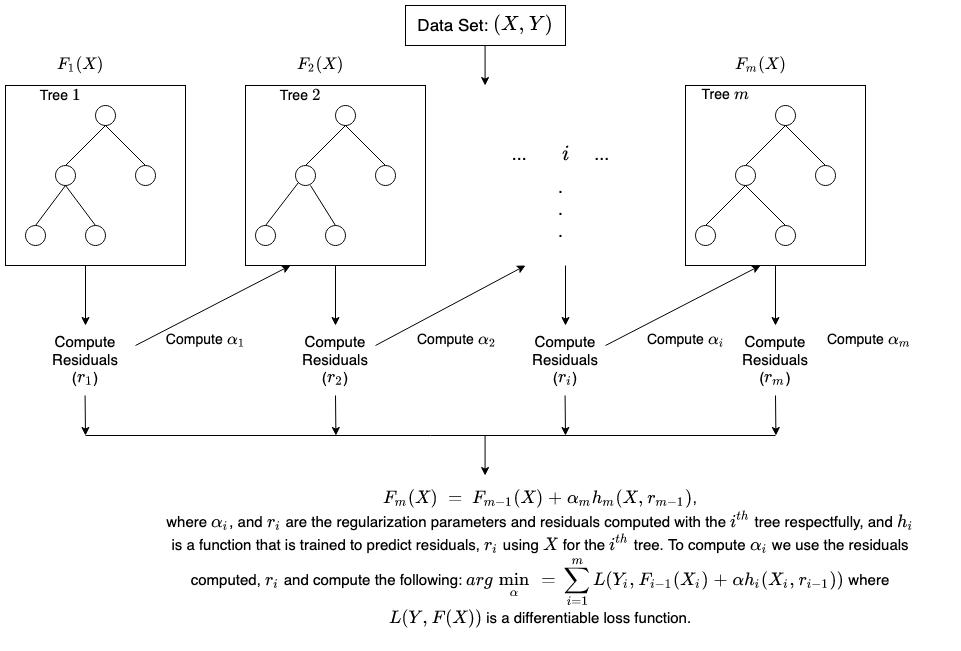

XGBoost (Extreme Gradient Boosting) is a part of ensemble model. True to its name, it is an implementation of gradient boosting. It is essentially a tree-based model that combines multiple trees, that individually is a weak learner to create a strong predictive model.

Shown by the illustration above, XGBoost works by building trees sequentially, where each tree corrects the erros of the previous tree by focusing on the residual, the goal is to minimized the loss function (in our case, MAPE) by adding trees that predict the residuals. XGBoost also includes regularization terms (L1 & L2) to prevent overfitting.

In [43]:
# Saving the final model (Xgboost)
final_model = best_xg
final_mape = mean_absolute_percentage_error(y_test, y_pred_xg)

# Create a residual DataFrame for plotting
results_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_xg})

results_df = results_df.reset_index(drop=True)

results_df

,Actual,Predicted
0,150300.0,166392.171875
1,234700.0,302209.406250
2,70400.0,72945.539062
3,134500.0,169873.296875
4,348100.0,353089.031250
...,...,...
2707,171800.0,188817.218750
2708,260900.0,263560.531250
2709,118800.0,103103.109375
2710,275400.0,273198.406250


>###	g.	Feature Importances / Coefficient Regression

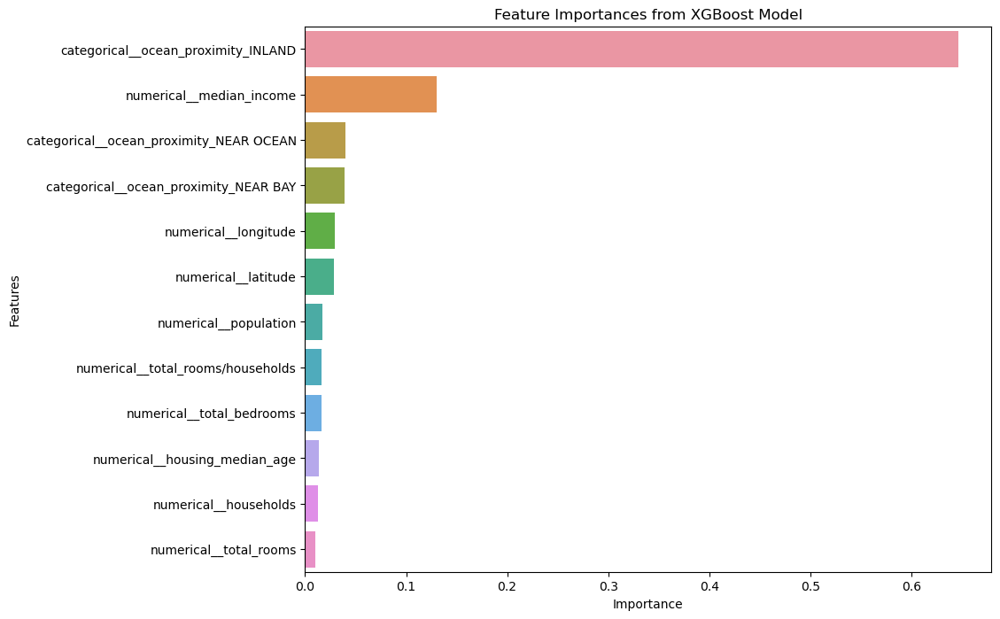

In [44]:
# Get feature importances
feature_importances = final_model[1].feature_importances_
features = preprocess.get_feature_names_out()

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({'Features': features, 'Importance': feature_importances}).sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 8))
sns.barplot(data=importance_df, y='Features', x='Importance')
plt.title('Feature Importances from XGBoost Model')
plt.show()

`Insight`

The most important features according to the XGboost model is ocean proximity feature of inland. When the houses block location is 'inland', which is the furthest away from the ocean, then the prices tends to be significantly lower. 

In the second spot is the income feature. Where the correlation is positive, meaning that the higher the income of a block tend to have higher prices. This is truly make sense as higher income people would build a more expensive house in the 'exclusive area'. Looking back at the analysis that we done, we can conclude that this two feature is indeed correlated, as the higher income people would build their houses in the 'exclusive area' which is in the area that tends to be closer to the ocean (bay area, and near ocean), so the opposites of that area which is the 'inland' that are the furthest from the ocean tends to have much lower prices (most of the houses are in this category) so it really make sense that this two features is considered to be the most important.

>###	h.	Residual Plot & Model Performance

In [45]:
def plot_residual(y_test, y_pred, title):
    residuals = y_test - y_pred

    fig, ax = plt.subplots(1,2,figsize=(18,6))


    sns.scatterplot(x = y_pred, y = residuals, alpha=0.5,color='navy',ax=ax[0])
    ax[0].hlines(y=0, xmin=min(y_pred), xmax=max(y_pred), colors='r', linestyles='dashed')
    ax[0].set_title(f'Residual Plot of {title}')
    ax[0].set_xlabel('Predicted Values')
    ax[0].set_ylabel('Residuals')

    sns.regplot(x=y_test, y=y_pred, color='skyblue',ax=ax[1], line_kws={'color':'red', 'lw':2, 'alpha':1, 'ls':'--'})
    ax[1].set_title(f'Actual Vs Prediction of {title}')
    ax[1].set_xlabel('Predicted Values')
    ax[1].set_ylabel('Actual Values')

    plt.show()

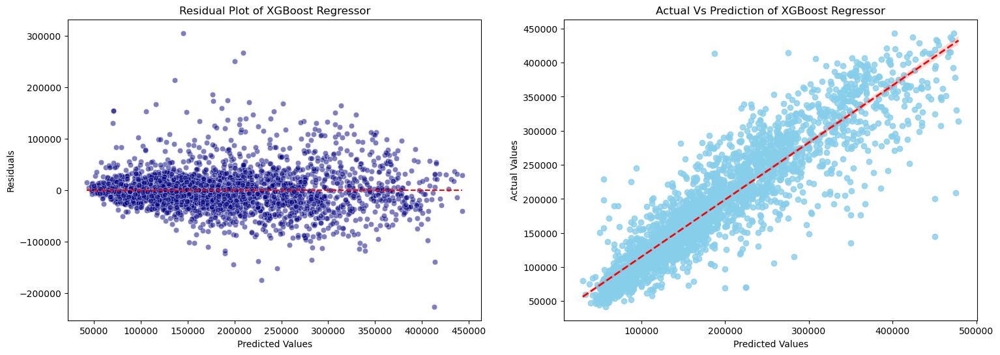

MAPE Score: 0.15793879349982903


In [46]:
plot_residual(results_df['Actual'], results_df['Predicted'], title='XGBoost Regressor')
print(f"MAPE Score: {final_mape}")

`Insight `

The final model XGBoostRegressor could make a prediction which resulted in Mean Absolute Percentage Error of 15.7% which means that the average of total error prediction when compared to the actual value is relatively low. The model that we develop can be considered to be good at forecasting ([source](https://www.researchgate.net/figure/nterpretation-of-typical-MAPE-values_tbl1_257812432#:~:text=Models%20with%20MAPE%20values%20below,incorrect%20and%20faulty%20%5B73%5D%20.)). According to the source above, MAPE value below 20% is considered as good at forecasting.
Which could be seen in the graph above. The red line graph on the residual plot shows that the residuals mostly distributed not to faraway from 0(which means that the prediction = actual values, the exact same values). Although there are quite a few residuals that are over 100.000 and a only a glimpse that are above 200.000, but in general the final model could generate a quite good prediction since the MAPE is on the 15% mark.
We can see that the final model is very good at predicting the values when it is ranging from 50.000 - 100.000 as the residual is very low


In [47]:
results_df['Residual'] = results_df['Actual'] - results_df['Predicted']

results_df

,Actual,Predicted,Residual
0,150300.0,166392.171875,-16092.171875
1,234700.0,302209.406250,-67509.406250
2,70400.0,72945.539062,-2545.539062
3,134500.0,169873.296875,-35373.296875
4,348100.0,353089.031250,-4989.031250
...,...,...,...
2707,171800.0,188817.218750,-17017.218750
2708,260900.0,263560.531250,-2660.531250
2709,118800.0,103103.109375,15696.890625
2710,275400.0,273198.406250,2201.593750


#### Model Performance per Range

In [ ]:
value_to_150k = results_df[results_df['Predicted']<=150000].reset_index(drop=True)
value_to_150k['Abs Error'] = np.abs(value_to_150k['Actual'] - value_to_150k['Predicted'])
value_to_150k['APE'] = value_to_150k['Abs Error'] / value_to_150k['Actual'] * 100 

value_to_250k = results_df[(results_df['Predicted']>150000) &(results_df['Predicted']<=250000)].reset_index(drop=True)
value_to_250k['Abs Error'] = np.abs(value_to_250k['Actual'] - value_to_250k['Predicted'])
value_to_250k['APE'] = value_to_250k['Abs Error'] / value_to_250k['Actual'] * 100 

value_to_350k = results_df[(results_df['Predicted']>250000) &(results_df['Predicted']<=350000)].reset_index(drop=True)
value_to_350k['Abs Error'] = np.abs(value_to_350k['Actual'] - value_to_350k['Predicted'])
value_to_350k['APE'] = value_to_350k['Abs Error'] / value_to_350k['Actual'] * 100

value_to_450k = results_df[results_df['Predicted']>350000].reset_index(drop=True)
value_to_450k['Abs Error'] = np.abs(value_to_450k['Actual'] - value_to_450k['Predicted'])
value_to_450k['APE'] = value_to_450k['Abs Error'] / value_to_450k['Actual'] * 100

mape_150 = value_to_150k['APE'].mean()
mape_250 = value_to_250k['APE'].mean()
mape_350 = value_to_350k['APE'].mean()
mape_450 = value_to_450k['APE'].mean()

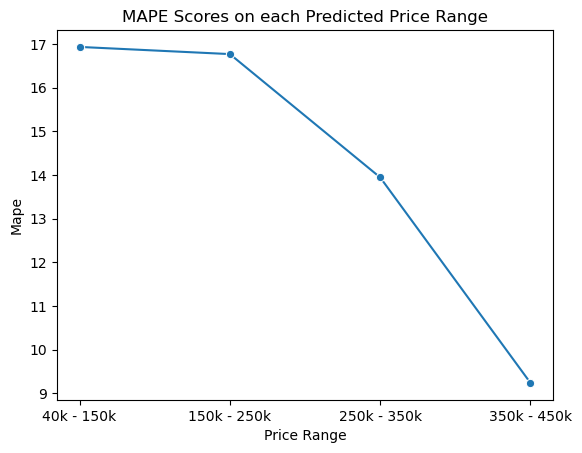

In [49]:
# Plotting to see the model performance per price range
mape_per_range = pd.DataFrame({
    'Price Range':['40k - 150k', '150k - 250k', '250k - 350k', '350k - 450k'],
    'Mape': [mape_150, mape_250, mape_350, mape_450]    
})

mape_per_range

sns.lineplot(data=mape_per_range, x='Price Range', y='Mape', marker='o')
plt.title('MAPE Scores on each Predicted Price Range')
plt.show()

`Insight`

The goal of this lineplot is to know which price range that the model could predict more accurately so we can determine when does the model will be trusted the most. On the plot above we can see that the model mape scores tend to be better the higher the house predicted value is, where the model MAPE is on 9,24. So our model can be trusted the most when it is predicting the house value of 350k-450k. Although, it does not mean that the model prediction on the lower price range can't be trusted at all, since the lowest MAPE score on 40k-150k price range is still below 20, that is still counted as a good score ([source](https://www.researchgate.net/figure/nterpretation-of-typical-MAPE-values_tbl1_257812432#:~:text=Models%20with%20MAPE%20values%20below,incorrect%20and%20faulty%20%5B73%5D%20.)). But it can be noted that the final model works best on the higher price end with the max value prediction of USD $443406.75

NOTE : The lower MAPE value on the higher price range and the higher MAPE value on the lower price range could also be caused by the value difference. Since the value is higher, meaning that the error percentage could be lower compared to the lower price range. For instance, if the residual is 50.000, and the actual value is 150.000 the MAPE will be 33%. But if the actual value is 300.000 with the same 50.000 residual, the MAPE will be 16%. 

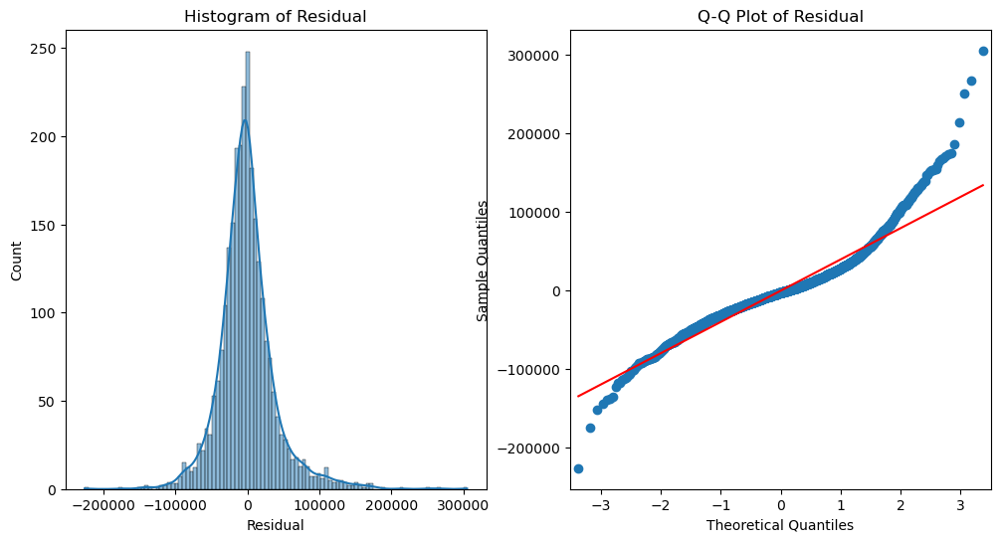

In [50]:
import statsmodels.api as sm 

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# membuat histogram
sns.histplot(results_df['Residual'], kde=True, ax=ax[0])
ax[0].set_title('Histogram of Residual')

# membuat qqplot
sm.qqplot(results_df['Residual'], line='s', ax=ax[1])
ax[1].set_title('Q-Q Plot of Residual')

plt.show()

Based on the q-q plot of residual plot above we can assume that the residuals distribution is not normally distributed. as the residual plot are distributed mostly not aligned with the red line in the case of normal distribution. It could be important if we use Linear Regression as our final model because it has to meet the residual normality assumption. But, since our final model is XGBoost which is a tree based model, we dont have to give special attention to this, and can continue on.

> #### Learning Curve

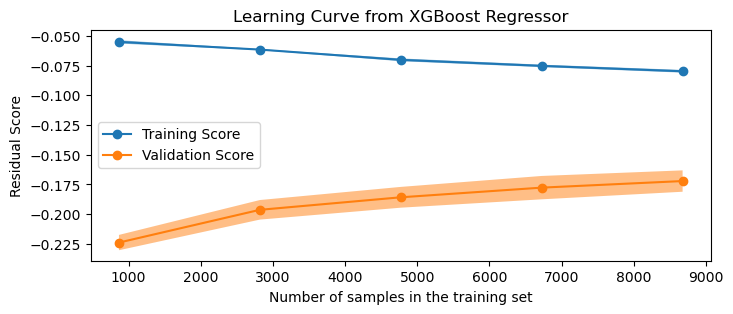

In [51]:
from sklearn.model_selection import LearningCurveDisplay

# Set figure size
fig, ax = plt.subplots(figsize=(8, 3))

# Set the required parameters
common_params={
    "X": X_train,
    "y": y_train,
    "train_sizes": np.linspace(0.1, 1, 5),
    "cv": 5,
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {'marker': 'o'},
    "score_name": 'mape',
    "scoring" : 'neg_mean_absolute_percentage_error'
}

# Generate learning curve plot
LearningCurveDisplay.from_estimator(final_model, **common_params, ax=ax)

# Set title and legend
handles, label = ax.get_legend_handles_labels()
ax.legend(handles[:2], ['Training Score', 'Validation Score'], loc='center left')
ax.set_title(f'Learning Curve from XGBoost Regressor')
ax.set_ylabel('Residual Score')

# Show the plot
plt.show()

`Insight `

The graph of learning curve display above shows that there are indication of overfitting in the model. As the highest residual score from the validation set only touch around -0.175 mark. While the residual score from the training set is on the -0.075 mark. There is a notable difference between those 2. Although we cant fully conclude that the model is indeed overfitting. The reason is based on the metrics evaluation (MAPE) of the model between cross validation in the training sets (0.1719) and the model prediction to the test set (0.1579), there is only a small amount of difference between the evaluation, even the prediction to the test set has a better score, indicating that the model is stable enough.

>### j.	Model Interpretation

#### Shap

100%|===================| 2703/2712 [02:23<00:00]        

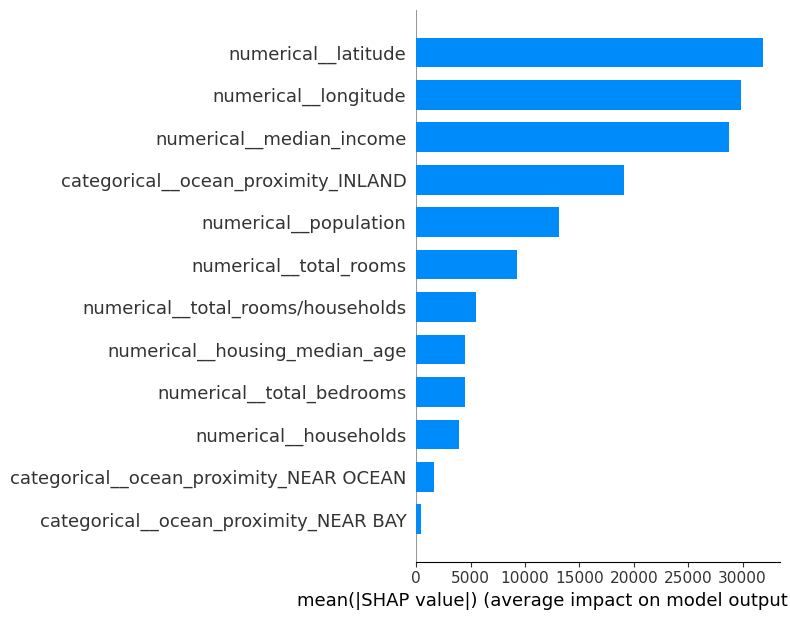

In [52]:
# Preprocessing x_test data using the preprocessor in the pipeline
encodedX_test = final_model[0].transform(X_test)

# Initialize SHAP
explainer = shap.Explainer(final_model[1], encodedX_test)
shap_values = explainer(encodedX_test)

# Summary plot
shap.summary_plot(shap_values, encodedX_test, plot_type="bar", feature_names=features)


In the SHAP interpretation the top 5 important features are a little bit different, where the geographical features is the most important in determining the house value (lat, long) the closer the location is to the bay/beach the price is more likely to be higher, although it still correlate with inland where (lat, long) can determine in detail the location of the house instead of only the categorical feature of ocean proximity. So the Shap interpretation is more detailed and specific using the house exact location. And then the importance followed by the median income, in which the correlation between the median income and the target is positive, meaning that the higher the median income will resulting in the higher value of the prediction.

In [53]:
shap.initjs()

In [54]:
# Creating dataframe for the preprocessed x test
X_test_transformed_df = pd.DataFrame(encodedX_test, columns=features)

In [55]:
# Creating function for shap plotting
def shap_plot(index,model,data):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(data)[index]
    force_plot = shap.force_plot(explainerModel.expected_value, shap_values_Model, data.iloc[[index]])
    print(f'The Actual Median House Value is {y_test.iloc[index]}')
    print(f'The Predicted Median House Value is {final_model[1].predict(X_test_transformed_df.iloc[[index]])}')
    return(force_plot)

#### Interpretation on data index 0

In [56]:
shap_plot(0, final_model[1], X_test_transformed_df)

The Actual Median House Value is 150300.0
The Predicted Median House Value is [166392.17]


- Features that influence the prediction to be higher
This is indicated by the red color that also represented with the arrow pointing to the right. The data on index 0 actual value is 167700, and the model predicted it to be 153028 which means the residual is 14000. The model could determine the value to be higher due to the median income of the block is relative high, and the number of total number which is also high, and the latitude

- Features that influence the prediction to be lower :
This is indicated by the blue color that also represented with the arrow pointing to the left. The model could determine the value to be lower due to its location from the ocean proximity feature that shows that this block is 'inland' which is the furthest away from the ocean, and also the population count.

#### Interpertation on data index 777

In [80]:
shap_plot(777, final_model[1], X_test_transformed_df)

The Actual Median House Value is 92400.0
The Predicted Median House Value is [93389.89]


- Features that influence the prediction to be higher
This is indicated by the red color that also represented with the arrow pointing to the right. The data on index 777 actual value is 93389.89, and the model predicted it to be 92400 which means the residual is 989. The model could determine the value to be higher due to the median age is considered low (not an old housing block), and the and the latitude location

- Features that influence the prediction to be lower :
This is indicated by the blue color that also represented with the arrow pointing to the left. The model could determine the value to be lower due to its location from the ocean proximity feature that shows that this block is 'inland' which is the furthest away from the ocean, and also the median income and the total rooms/household is considered low 

In [58]:
# Creating function for shap tree explainer plotting
def shap_decision(index,model,data):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(data)[index]
    p = shap.decision_plot(explainerModel.expected_value, shap_values_Model, data.iloc[[index]])
    print(f'The Actual Median House Value is {y_test.iloc[index]}')
    print(f'The Predicted Median House Value is {final_model[1].predict(X_test_transformed_df.iloc[[index]])}')
    return(p)

#### Interpretation on data index 10

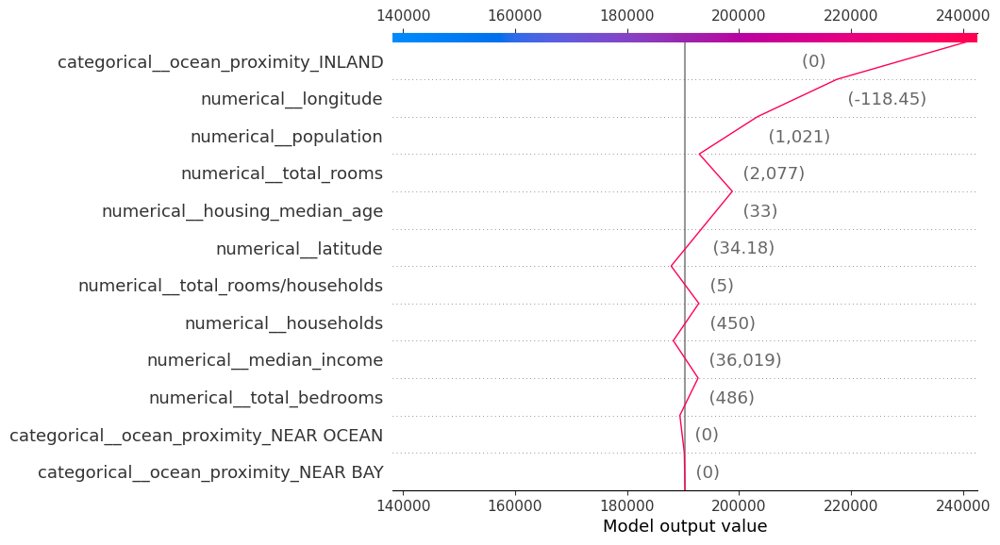

The Actual Median House Value is 225000.0
The Predicted Median House Value is [240529.42]


In [59]:
shap_decision(10, final_model[1], X_test_transformed_df)

The Actual Median House Value is 225000. The Predicted Median House Value is 240529.42 which means that the residual on this data is 15529.  On this shap visualization, we can see all of the features and its contribution to the model prediction and its direction, whether the direction to the positive or to the negative value . from the highest to the lowest, on this data. the most feature that influence the price to be higher is the ocean proximity which the inland is 0, meaning the house block is not located on the inland. So the geographical feature is the most important feature in predicting the house value. And then, also the total population which is not too high.

#### LIME

In [61]:
# Explainer based LIME
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_test_transformed_df),
    feature_names=features,
    mode='regression'
)

#### LIME Explanation on data index 7

The Actual Median Housing Price of this data is 131300.0


The Predicted Median Housing Price of this data is [149770.38]


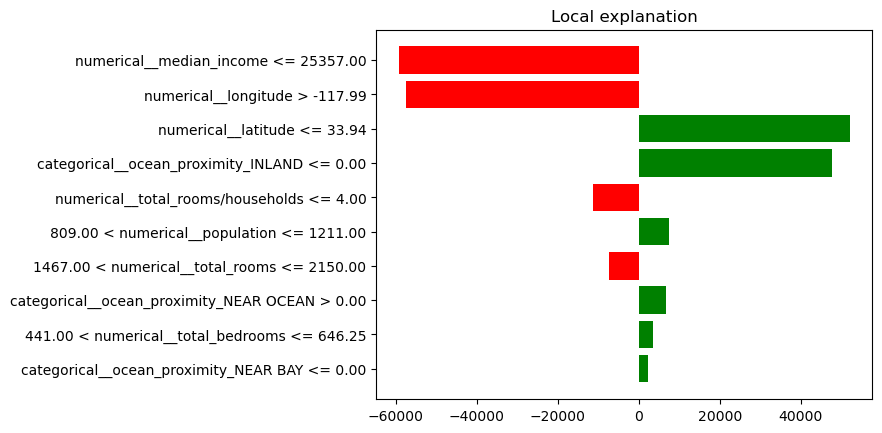

In [63]:
print(f'The Actual Median Housing Price of this data is {y_test.iloc[7]}')
print(f'The Predicted Median Housing Price of this data is {final_model[1].predict(X_test_transformed_df.iloc[[7]])}')

exp = explainer.explain_instance(X_test_transformed_df.iloc[7], 
                                 final_model[1].predict, 
                                 num_features=10)
exp.as_pyplot_figure()
plt.show()

The Actual Median Housing Price of this data is 131300. The Predicted Median Housing Price of this data is 149770, which means the residual is 18470. The most significant factor influencing the house price in the California housing dataset is the median income. Higher median income has a substantial positive impact on housing prices. The condition `numerical__median_income <= 25357.00` has a strong negative impact, indicating that lower median income values are associated with a significant reduction in house prices. The geographical location, specifically longitude and latitude, also plays a critical role. The condition `numerical__longitude > -117.99` has a strong negative impact, while `numerical__latitude <= 33.94` has a notable positive impact on house prices. Proximity to the ocean influences house prices, with `categorical__ocean_proximity_INLAND == 0.00` (indicating a location near the ocean) positively impacting prices.

> #### k. Saving Model

In [64]:
final_model.fit(X,y)

pickle.dump(final_model, open('XGBRegressor_Housing.sav', 'wb'))

In [65]:
model_load = pickle.load(open('XGBRegressor_Housing.sav','rb'))

model_load

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numerical',
                                                  Pipeline(steps=[('imputer',
                                                                   IterativeImputer(initial_strategy='median'))]),
                                                  ['longitude', 'latitude',
                                                   'housing_median_age',
                                                   'total_rooms',
                                                   'total_bedrooms',
                                                   'population', 'households',
                                                   'median_income',
                                                   'total_rooms/households']),
                                                 ('categorical',
                                                  Pipeline(steps...
                              feature_types=None, gamma=0.5, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=9, max_leaves=None, min_child_weight=2,
                              missing=nan, monotone_constraints=None,
                              multi_strategy=None, n_estimators=400,
                              n_jobs=None, num_parallel_tree=None,
                              random_state=7, ...))])

> #### l.	Cost Benefit Analysis

>> Machine Learning Model

`Costs:`
1. Development and Maintenance:
    - Initial Setup: Cost of data collection, data preprocessing, model training, and validation.
    - Tools and Software: Licensing costs for software like Python, R, data storage, and computation power (e.g., cloud services).
    - Human Resources: Salaries for data scientists, machine learning engineers, and analysts.

2. Operational Costs:
    - Computational Resources: Cost of running the model predictions (e.g., servers, cloud computing).
    - Updates and Retraining: Regular updates to the model as new data becomes available.

3. Miscellaneous:
    - Training: Training staff to understand and use the model's outputs effectively.
    - Monitoring and Support: Ensuring the model's performance remains consistent and accurate over time.

4. Price: [Source](https://hackernoon.com/machine-learning-costs-price-factors-and-real-world-estimates)
    - Development : +- $50.000
    - Maintenance/Month: +- $1.000


`Benefits:`
1. Accuracy and Consistency:
    - Higher Precision: ML models can leverage large datasets to provide highly accurate predictions.
    - Good accuracy (+-16% residual on $40k - $250k price range), Good accuracy (+-13% $250k - $350k), High accuracy (+- 9% residual on $350k - $450k price range)
    - Consistency: Unlike human valuators, ML models provide consistent outputs without biases or fatigue.

2. Scalability and Efficiency:
    - Speed: Models can generate predictions in seconds, significantly faster than manual evaluations.
    - Scalability: Capable of handling large volumes of predictions simultaneously.

3. Cost Reduction:
    - Reduced Labor Costs: Once deployed, the model can replace or supplement human valuators, reducing the need for large teams of appraisers.

4. Data-Driven Insights:
    - Comprehensive Analysis: Models can uncover patterns and insights from data that may not be apparent to human valuators.

>> Human Valuator


`Costs:`
1. Labor Costs:
    - Salaries: High cost of hiring qualified and experienced valuators.
    - Training: Ongoing training and certification to keep valuators updated with market trends and standards.

2. Time:
    - Evaluation Time: Human valuators take significantly longer to assess properties (days to weeks)

3. Operational Costs:
    - Logistics: Travel expenses and other logistical costs for on-site evaluations.
    - Office Overheads: Administrative costs, office space, and other related expenses.

4. Inconsistency:
    - Evaluations can be subject to personal biases, errors, and fatigue, leading to inconsistent results.

5. Price : [Source](https://www.houzeo.com/blog/how-much-is-a-home-appraisal-in-california/#:~:text=A%20single%2Dfamily%20home%20appraisal,meets%20safety%20and%20structural%20requirements.)
    - $325 – $425 per house (for a single-family house)
    - $600 – $1,500 per house (for a multifamily house)

`Benefits:`
1. Expertise and Intuition:
    - Local Knowledge: Valuators can leverage their deep understanding of local markets and trends.
    - Contextual Understanding: Ability to factor in qualitative aspects that may not be captured by data.

2. Trust and Credibility:
    - Established Trust: Clients may trust human valuators more due to their professional reputation and personal touch.
    - Regulatory Compliance: Human valuations are often required for legal and financial transactions.

3. Adaptability:
    - Flexibility: Can adapt to unique cases and unusual properties where data may be limited or non-standard.

-------------------------------------------------------------------------------------------------------------------
_TABLE OF SUMMARY_        
| Aspect | Machine Learning Model | Human Valuator |
| --- | --- | --- |
| Initial Setup Cost | High (development, software, data collecting) | Moderate (hiring, training) |
| Operational Cost | Low (computational resources) | High (salaries, travel, overheads) |
| Speed | Very High (seconds to minutes) | Low (days to weeks) |
| Scalability | High (can handle many evaluations at once) | Low (limited by human capacity) |
| Accuracy | Good (+-16% residual on $40k - $250k price range), Good (+-13% $250k - $350k), High (+- 9% residual on $350k - $450k price range) | Variable (depends on individual)
| Trust and Credibility | Growing (with increasing acceptance) | High (established trust) |
| Bias and Errors | Low (less prone to bias) | Higher (subject to human biases) |
| Local Expertise | Limited (depends on data input) | High (expert knowledge of local markets) |
| Long-term Cost | Low (once developed, low maintenance cost) | High (ongoing salaries and expenses) |

Source : https://www.rocketmortgage.com/learn/how-long-does-an-appraisal-take

>   ###	l.	Model Limitation

The model could only make prediction for houses in California specifically from the (-124.35, 41.95) to (-114.31, 32.54), with the housing age from 1 - 52 years, total rooms of 1-6 per house, and population of 3 - 35682. Since the dataset is originated from a census conducted in the year of 1990. So the prediction may or may not still be relevant in +- 5 years time (1995). 


## 7	Conclusion and Recomendation	

>  ### 	a.	Conclusion
- 9 Models are tested (including 4 ensemble models), in which the top 3 model with the lowest MAPE scores on the cross validation and to the test set are XGBoost, Random Forest, and Gradient Boost. Those top 3 models are tuned seeking for further improvement, and then afterwards we have succesful to improve the model accuracy more.

- Among the top 3 models that are hypertuned, XGBoost eventually came on top as the most accurate model with the MAPE of 15.7% across the test set. So, XGBoost is saved to be the final model.

- The models prediction are based on 10 features, but these are the features that affects the price prediction the most:

    1. The geographical location. This can be determined specifically by the latitude and longitude, but also can be determined by the ocean_proximity feature, in which the further away a house block is from the ocean, then the price tends to be lower, that is why if the ocean_proximity of a block is 'Inland' the model will predict the prices to be low

    2. The median income. The higher the median income of a block, will resulting the price prediction to be also higher. From what we analyzed, it is clear that median income have a positive correlation with the house value, as richer people tends to build / buys their house in the 'exclusive' location that if we further look for more correlation, the 'exclusive location' are closer to the ocean.
     

>  ###	b.	Model Recommendation
1. Update the data as it is outdated for more than 30 years, making the data and the prediction not releveant for now at all. So, if we want to implement the model we must update the data. And evaluate the model.

2. Since each rows of this dataset representing a block, instead of a single individual house, for further data collecting it will be beneficial if each rows of the data represents a single house to improve the modeling accuracy and the interpretation.


>   ### c. Business Recommendation
1. **Target High-Value Areas**:
   - **Insight**: Use the model's predictions to identify neighborhoods with the highest property values.
   - **Action**: Focus marketing efforts and resources on these high-value areas to attract potential buyers and sellers.

2. **Optimize Pricing Strategy**:
   - **Insight**: The model can provide precise price estimates based on various features like location, size, and age.
   - **Action**: Use these estimates to set competitive and accurate prices for properties. This can help in faster sales and better client satisfaction.

3. **Enhance Property Listings**:
   - **Insight**: Feature importance analysis from XGBoost can highlight the most influential factors affecting property prices.
   - **Action**: Emphasize these key features in property listings and advertisements. For example, we could highlight the ocean proximity feature if it is close to the ocean for the listings since it is known as the most people preferenced area.

6. **Customized Client Recommendations**:
   - **Insight**: Use the model to tailor recommendations based on client preferences and budget.
   - **Action**: Offer personalized property suggestions to clients, enhancing their buying experience and increasing the likelihood of a sale.
